In [0]:
from scipy import misc
from PIL import Image
from skimage import exposure
from sklearn import svm

import scipy
from math import sqrt,pi
from numpy import exp
from matplotlib import pyplot as plt
import numpy as np
import glob
import matplotlib.pyplot as pltss
import cv2
from matplotlib import cm
import pandas as pd
from math import pi, sqrt
import pywt
from tqdm import tqdm



# Pre-processing

In [0]:
from google.colab import drive 
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
data_dir = '/content/drive/My Drive/EDI2 - Diabetic Ratinopathy/IDRID Dataset/B. Disease Grading/1. Original Images/a. Training Set/'

In [0]:
df_train = pd.read_csv('/content/drive/My Drive/EDI2 - Diabetic Ratinopathy/IDRID Dataset/B. Disease Grading/2. Groundtruths/a. IDRiD_Disease Grading_Training Labels.csv')

In [0]:
df_train.head()

,Image name,Retinopathy grade,Risk of macular edema,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11
0,IDRiD_001,3,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IDRiD_002,3,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IDRiD_003,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IDRiD_004,3,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,IDRiD_005,4,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(2848, 4288, 3)


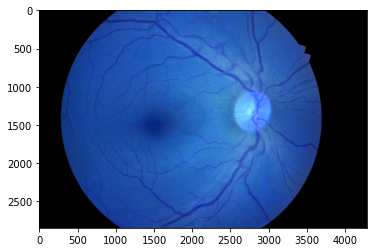

(1024, 1024, 3)


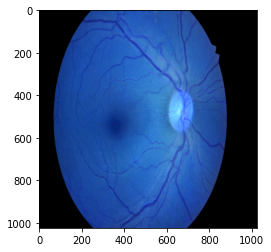

In [0]:
size_img = 1024,1024
img = cv2.imread(data_dir+'IDRiD_201.jpg')
plt.imshow(img)
print(img.shape)
plt.show()
img1 = cv2.resize(img, size_img)
plt.imshow(img1)
print(img1.shape)
plt.show()

In [0]:
#img_rows=img_cols=200
immatrix=[]
im_unpre = []
#image_path = Image.open('C:\Users\Rohan\Desktop\Diabetic_Retinopathy\diaretdb1_v_1_1\diaretdb1_v_1_1\resources\images\ddb1_fundusimages\image0')
#image = misc.imread(image_path)
l = []
labels = []
size_img = 1024,1024
for f, breed in tqdm(df_train[['Image name', 'Retinopathy grade']].values):
    if type(cv2.imread(data_dir+'/{}.jpg'.format(f)))==type(None):
        continue
    else:
        img = cv2.imread(data_dir+'/{}.jpg'.format(f))
        labels.append(breed)
        #print(img.shape)
        img1 = cv2.resize(img, size_img)
    #im_unpre.append(np.array(img).flatten())
    img_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    #equ = cv2.equalizeHist(img1)
    l.append([np.shape(img_gray)]) 
    immatrix.append(np.array(img_gray).flatten())
    #res = np.hstack((img_gray,equ))

100%|██████████| 413/413 [01:57<00:00,  3.52it/s]


In [0]:
l_labels = list(df_train[ 'Retinopathy grade'])
for i in range(5):
  print(i,": ",l_labels.count(i))

0 :  134
1 :  20
2 :  136
3 :  74
4 :  49


In [0]:
len(l_labels)

413

In [0]:
len(immatrix)

413

In [0]:
set(labels)

{0, 1, 2, 3, 4}

In [0]:
size_img = 1024,1024

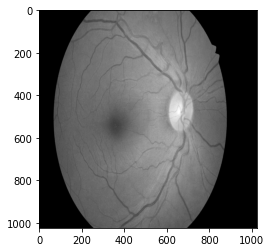

In [0]:
plt.imshow(immatrix[200].reshape((size_img)),cmap='gray')
plt.show()

In [0]:
l = []
for i in immatrix:
  l.append([np.shape(i)])


In [0]:
print(len(l))
l2 = []
for i in l:
  if i not in l2:
    l2.append(i)
print(l2)

413
[[(85204,)]]


In [0]:
len(immatrix)

413

Visualising a random image after the above steps the array contains 300 images

The shape of the image is determined from np.shape(equ) and those values are 1152,1500

(1048576,)


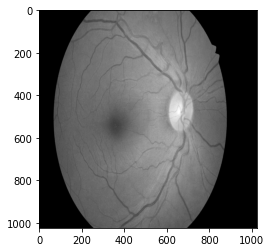

In [0]:
i = 200
print(np.shape(immatrix[i]))
#print(np.shape(equ))
plt.imshow(immatrix[i].reshape((size_img)),cmap='gray')
plt.show()


Performing Discrete-Wavelet transform on the 2-D array available

 the Haar wavelet is a sequence of rescaled "square-shaped" functions which together form a wavelet family or basis. Wavelet analysis is similar to Fourier analysis in that it allows a target function over an interval to be represented in terms of an orthonormal basis. The Haar sequence is now recognised as the first known wavelet basis and extensively used as a teaching example.

In [0]:
len(immatrix)

413

In [0]:
imm_dwt = []
for equ in immatrix:
    #print(np.shape(equ))
    equ = equ.reshape((size_img))
    coeffs = pywt.dwt2(equ, 'haar')
    equ2 = pywt.idwt2(coeffs, 'haar')
    imm_dwt.append(np.array(equ2).flatten())


Visualising a random image 

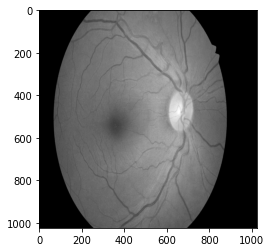

In [0]:
np.shape(imm_dwt)
np.shape(equ2)
plt.imshow(imm_dwt[200].reshape((size_img)),cmap='gray')
plt.show()

In [0]:
def _filter_kernel_mf_fdog(L, sigma, t = 3, mf = True):
    dim_y = int(L)
    dim_x = 2 * int(t * sigma)
    arr = np.zeros((dim_y, dim_x), 'f')
    
    ctr_x = dim_x / 2 
    ctr_y = int(dim_y / 2.)

    # an un-natural way to set elements of the array
    # to their x coordinate. 
    # x's are actually columns, so the first dimension of the iterator is used
    it = np.nditer(arr, flags=['multi_index'])
    while not it.finished:
        arr[it.multi_index] = it.multi_index[1] - ctr_x
        it.iternext()

    two_sigma_sq = 2 * sigma * sigma
    sqrt_w_pi_sigma = 1. / (sqrt(2 * pi) * sigma)
    if not mf:
        sqrt_w_pi_sigma = sqrt_w_pi_sigma / sigma ** 2

    #@vectorize(['float32(float32)'], target='cpu')
    def k_fun(x):
        return sqrt_w_pi_sigma * exp(-x * x / two_sigma_sq)

    #@vectorize(['float32(float32)'], target='cpu')
    def k_fun_derivative(x):
        return -x * sqrt_w_pi_sigma * exp(-x * x / two_sigma_sq)

    if mf:
        kernel = k_fun(arr)
        kernel = kernel - kernel.mean()
    else:
        kernel = k_fun_derivative(arr)

    # return the "convolution" kernel for filter2D
    return cv2.flip(kernel, -1) 

def show_images(images,titles=None, scale=1.3):
    """Display a list of images"""
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images,titles):
        a = fig.add_subplot(1,n_ims,n) # Make subplot
        if image.ndim == 2: # Is image grayscale?
            plt.imshow(image, cmap = cm.Greys_r)
        else:
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        a.set_title(title)
        plt.axis("off")
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches(), dtype=np.float) * n_ims / scale)
    plt.show()


def gaussian_matched_filter_kernel(L, sigma, t = 3):
    '''
    K =  1/(sqrt(2 * pi) * sigma ) * exp(-x^2/2sigma^2), |y| <= L/2, |x| < s * t
    '''
    return _filter_kernel_mf_fdog(L, sigma, t, True)

#Creating a matched filter bank using the kernel generated from the above functions
def createMatchedFilterBank(K, n = 12):
    rotate = 180 / n
    center = (K.shape[1] / 2, K.shape[0] / 2)
    cur_rot = 0
    kernels = [K]

    for i in range(1, n):
        cur_rot += rotate
        r_mat = cv2.getRotationMatrix2D(center, cur_rot, 1)
        k = cv2.warpAffine(K, r_mat, (K.shape[1], K.shape[0]))
        kernels.append(k)

    return kernels

#Given a filter bank, apply them and record maximum response

def applyFilters(im, kernels):

    images = np.array([cv2.filter2D(im, -1, k) for k in kernels])
    return np.max(images, 0)


gf = gaussian_matched_filter_kernel(10, 5)
bank_gf = createMatchedFilterBank(gf, 4)

imm_gauss = []
for equ2 in imm_dwt:
    equ2 = equ2.reshape((size_img))
    equ3 = applyFilters(equ2,bank_gf)
    imm_gauss.append(np.array(equ3).flatten())


(413, 1048576)


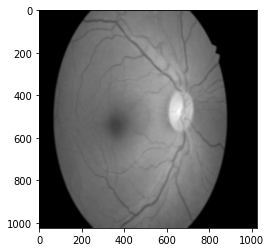

In [0]:
# the array ranges from 0 - 299
print(np.shape(imm_gauss))
plt.imshow(imm_gauss[200].reshape((size_img)),cmap='gray')
plt.show()

In [0]:
def createMatchedFilterBank():
    filters = []
    ksize = 31
    for theta in np.arange(0, np.pi, np.pi / 16):
        kern = cv2.getGaborKernel((ksize, ksize), 6, theta,12, 0.37, 0, ktype=cv2.CV_32F)
        kern /= 1.5*kern.sum()
        filters.append(kern)
    return filters

def applyFilters(im, kernels):
    images = np.array([cv2.filter2D(im, -1, k) for k in kernels])
    return np.max(images, 0)

bank_gf = createMatchedFilterBank()
#equx=equ3
#equ3 = applyFilters(equ2,bank_gf)
imm_gauss2 = []
for equ2 in imm_dwt:
    equ2 = equ2.reshape((size_img))
    equ3 = applyFilters(equ2,bank_gf)
    imm_gauss2.append(np.array(equ3).flatten())


In [0]:
size_img

(238, 358)

(413, 85204)


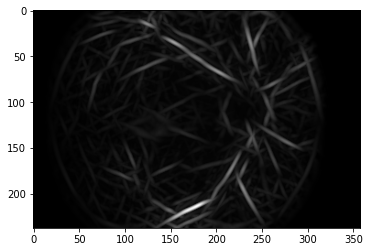

In [0]:
# the array ranges from 0 - 299
print(np.shape(imm_gauss2))
plt.imshow(imm_gauss2[200].reshape((size_img)),cmap='gray')
plt.show()

(413, 65536)


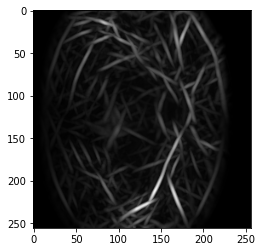

413


In [0]:
# the array ranges from 0 - 299
print(np.shape(imm_gauss2))
plt.imshow(imm_gauss2[200].reshape((256,256)),cmap='gray')
plt.show()
print(len(imm_gauss2))

In [0]:
e_ = equ3
print(np.shape(e_))
e_=e_.reshape((-1,1))
np.shape(e_)

(238, 358)


(85204, 1)

Performing K-means Clusttering with PP centers(non random) neighbours on the final image

In [0]:
img = equ3
Z = img.reshape((-1,1))

# convert to np.float32
Z = np.float32(Z)

k=cv2.KMEANS_PP_CENTERS


# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 2
ret,label,center=cv2.kmeans(Z,K,None,criteria,10,k)

# Now convert back into uint8, and make original image
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img.shape))

In [0]:
imm_kmean = []
for equ3 in imm_gauss2:
    img = equ3.reshape((size_img))
    Z = img.reshape((-1,1))

    # convert to np.float32
    Z = np.float32(Z)

    k=cv2.KMEANS_PP_CENTERS


    # define criteria, number of clusters(K) and apply kmeans()
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    K = 2
    ret,label,center=cv2.kmeans(Z,K,None,criteria,10,k)

    # Now convert back into uint8, and make original image
    center = np.uint8(center)
    res = center[label.flatten()]
    res2 = res.reshape((img.shape))
    imm_kmean.append(np.array(res2).flatten())



413
(85204,)


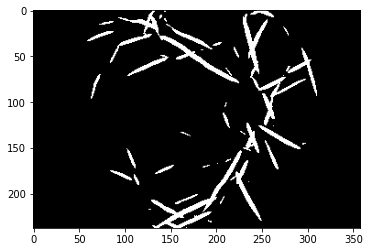

In [0]:
# the array ranges from 0 - 89
print(len(imm_kmean))
print(np.shape(imm_kmean[200]))
plt.imshow(imm_kmean[200].reshape((size_img)),cmap="gray")
plt.show()

413
(85204,)


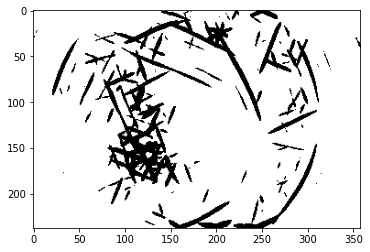

In [0]:
# the array ranges from 0 - 89
print(len(imm_kmean))
print(np.shape(imm_kmean[0]))
plt.imshow(imm_kmean[0].reshape((size_img)),cmap="gray")
plt.show()

413
(65536,)


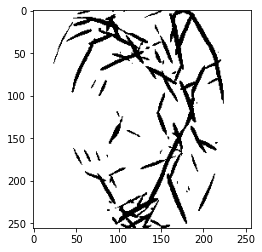

In [0]:
# the array ranges from 0 - 89
print(len(imm_kmean))
print(np.shape(imm_kmean[200]))
plt.imshow(imm_kmean[200].reshape((256,256)),cmap="gray")
plt.show()

In [0]:
df_train['image'][0]

KeyError: ignored

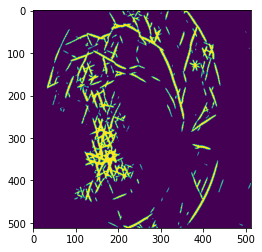

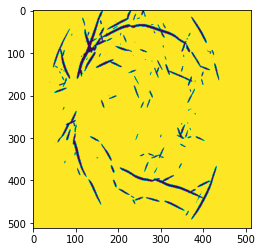

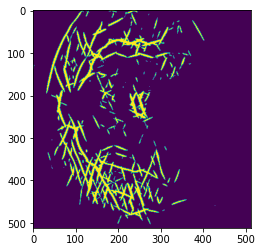

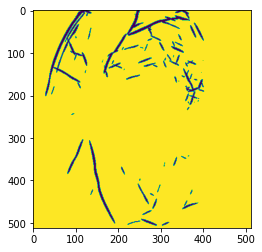

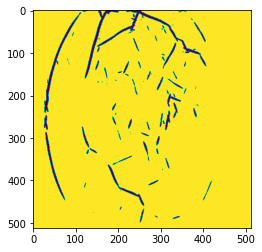

...

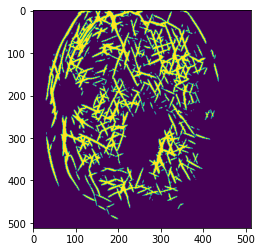

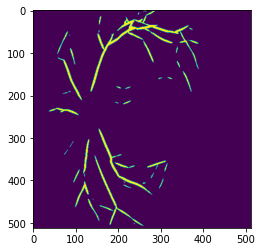

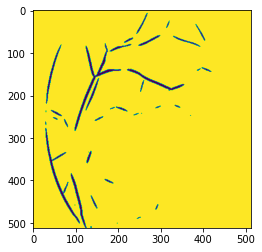

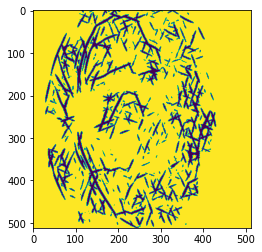

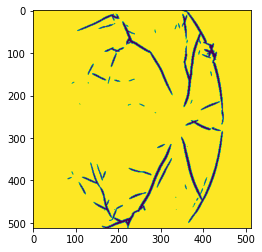

In [0]:
for i in range(300):
  #print(df_train['image'][i])
  plt.imshow(imm_kmean[i].reshape((512,512)))
  plt.show()

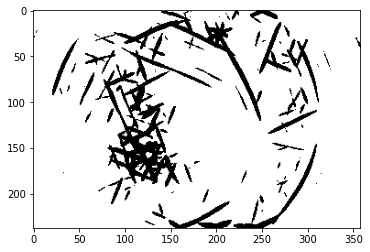

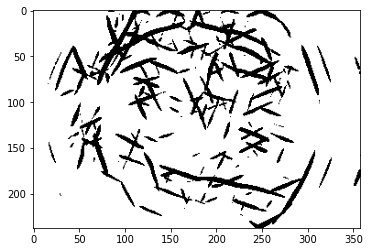

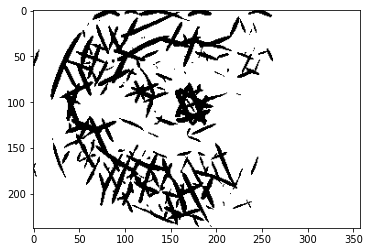

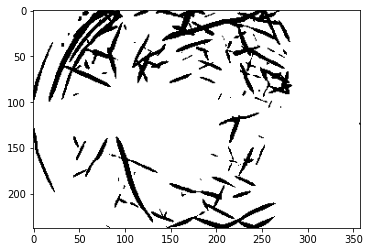

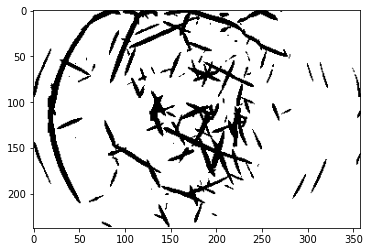

...

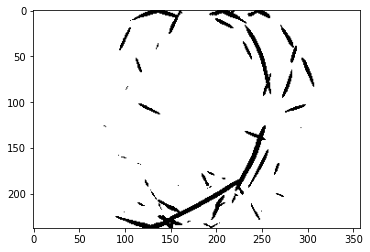

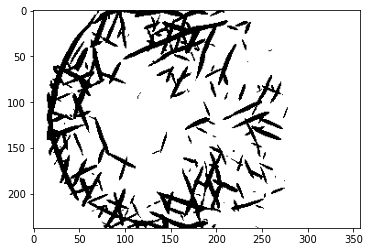

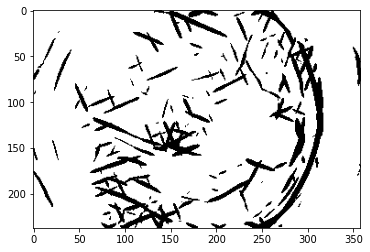

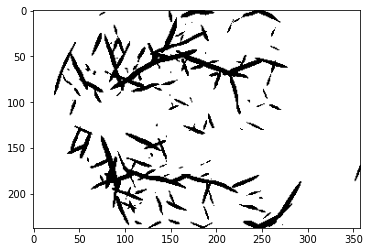

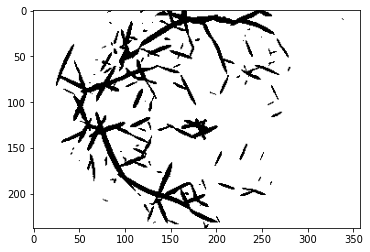

KeyboardInterrupt: ignored

In [0]:
for i in range(300):
  #print(df_train['image'][i])
  plt.imshow(imm_kmean[i].reshape((size_img)),cmap="gray")
  plt.show()

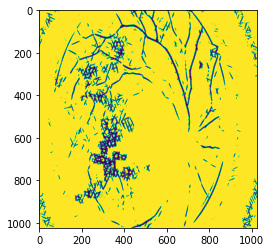

In [0]:
import cv2
im_gray = imm_kmean1[0]
(thresh, im_bw) = cv2.threshold(im_gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
plt.imshow(im_bw.reshape((1024,1024)))
plt.show()

In [0]:
imm_bw = []
for i in range(len(imm_kmean1)):
  im_gray = imm_kmean1[i]
  (thresh, im_bw) = cv2.threshold(im_gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
  #print(thresh)
  imm_bw.append(im_bw)

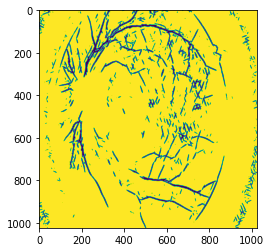

In [0]:
import cv2

plt.imshow(imm_bw[1].reshape((1024,1024)))
plt.show()

In [0]:
tt = []
for i in im_bw:
  if i not in tt:
    tt.append(i)
tt

[array([255], dtype=uint8), array([0], dtype=uint8)]

In [0]:
imm_kmean1 = np.array(imm_kmean)
np.save('/content/drive/My Drive/EDI2 - Diabetic Ratinopathy/IDRID Dataset/B. Disease Grading/imm_kmean_256_1',imm_kmean1)

In [0]:
imm_kmean1 = np.load('/content/drive/My Drive/EDI2 - Diabetic Ratinopathy/IDRID Dataset/B. Disease Grading/imm_kmean_1024.npy')

In [0]:
imm_kmean1.shape

(413, 1048576)

In [0]:
imm_bw1 = np.array(imm_bw)
imm_bw1.shape

NameError: ignored

In [0]:
imm_bw1 = imm_bw1.reshape(413,1048576)
imm_bw1.shape

(413, 1048576)

In [0]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.svm import SVC

In [0]:
X = imm_kmean1
Y = df_train['Retinopathy grade']

In [0]:
Y1 = []
for i in Y:
  if(i==0 or i==1):
    Y1.append(0)
  if(i==2):
    Y1.append(1)
  if(i==3 or i==4):
    Y1.append(2)

In [0]:
Y1 = pd.Series(Y1)

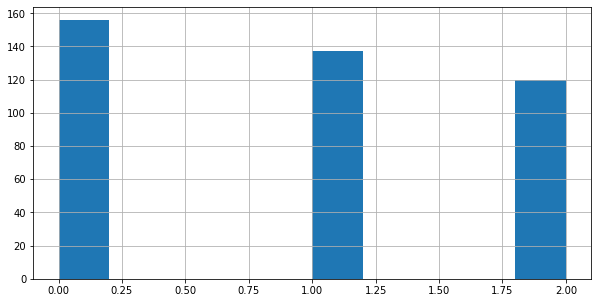

In [0]:
Y1.hist(figsize = (10, 5))

In [0]:
x_train, x_test, y_train, y_test = train_test_split(X, Y1, test_size = 0.15)

In [0]:
l_labels = list(Y1)
for i in range(3):
  print(i,": ",l_labels.count(i))

0 :  156
1 :  137
2 :  120


(351, 1024, 1024, 1)
(62, 1024, 1024, 1)


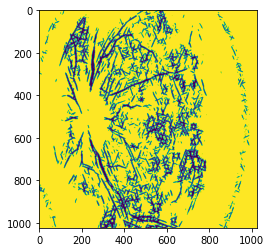

In [0]:
x_train = np.array(x_train)
x_test = np.array(x_test)

x_train1 = x_train.reshape(351,1024,1024,1)
print(x_train1.shape)

x_test1 = x_test.reshape(62,1024,1024,1)
print(x_test1.shape)

#print(set(xtrain1[0]))
plt.imshow(x_train1[0].reshape((1024,1024)))
plt.show()

from sklearn.preprocessing import OneHotEncoder
onehot_encoder = OneHotEncoder(sparse=False)

y_train = np.array(y_train)
y_test = np.array(y_test)

y_train1 = y_train.reshape(len(y_train), 1)
y_train1 = onehot_encoder.fit_transform(y_train1)

y_test1 = y_test.reshape(len(y_test), 1)
y_test1 = onehot_encoder.fit_transform(y_test1)


In [0]:

from keras.applications.vgg16 import VGG16
model = VGG16()

Using TensorFlow backend.


553467904/553467096 [==============================] - 34s 0us/step




In [0]:
#Without Hyper Parameters Tuning
#1-4,kNearestNeighbors
#importing module
from sklearn.neighbors import KNeighborsClassifier
#making the instance
model = KNeighborsClassifier(n_jobs=-1, n_neighbors=2, algorithm='kd_tree')
#learning
model.fit(x_train,y_train)
#Prediction
prediction=model.predict(x_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))

Accuracy: 0.5


In [0]:
from sklearn.metrics import confusion_matrix
print("Confusion Metrix:\n",confusion_matrix(prediction,y_test))
matrix = confusion_matrix(prediction,y_test)

Confusion Metrix:
 [[18 15  6]
 [ 7 12  2]
 [ 1  0  1]]


In [0]:
from sklearn.preprocessing import normalize

normed_matrix = normalize(matrix, axis=1, norm='l1')
normed_matrix

array([[0.46153846, 0.38461538, 0.15384615],
       [0.33333333, 0.57142857, 0.0952381 ],
       [0.5       , 0.        , 0.5       ]])

In [0]:
set(list(prediction))

{0, 2}

In [0]:
clf = SVC(kernel='rbf',C=1000,gamma=0.0001)
clf = clf.fit(x_train, y_train)

In [0]:
y_pred = np.round( clf.predict(x_test), 0)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.42      1.00      0.59        26
           1       0.00      0.00      0.00        27
           2       0.00      0.00      0.00         9

    accuracy                           0.42        62
   macro avg       0.14      0.33      0.20        62
weighted avg       0.18      0.42      0.25        62



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [0]:
#importing module
from sklearn import svm
#making the instance
model = svm.SVC(random_state=123, kernel='linear',C=6,gamma=0.0001)
#learning
model.fit(x_train,y_train)
#Prediction
prediction=model.predict(x_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

KeyboardInterrupt: ignored

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn import svm
#making the instance
model=svm.SVC()
#Hyper Parameters Set
params = {'C': [6,7,8,9,10,11,12], 
          'kernel': ['linear','rbf']}
#Making models with hyper parameters sets
model1 = GridSearchCV(model, param_grid=params, n_jobs=-1)
#Learning
model1.fit(x_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model1.best_params_)
#Prediction
prediction=model1.predict(x_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
exception calling callback for <Future at 0x7f8fb615d320 state=finished raised TerminatedWorkerError>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "/usr/local/lib/python3.6/dist-packages/joblib/parallel.py", line 340, in __call__
    self.parallel.dispatch_next()
  File "/usr/local/lib/python3.6/dist-packages/joblib/parallel.py", line 769, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "/usr/local/lib/python3.6/dist-packages/joblib/parallel.py", line 835, in dispatch_one_batch
    self._dispatch(tasks)
  File "/usr/local/lib/python3.6/dist-packages/joblib/parallel.py", line 754, in _dispatch
    job = self._

TerminatedWorkerError: ignored

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
#making the instance
model=RandomForestClassifier()
#hyper parameters set
params = {'criterion':['gini','entropy'],
          'n_estimators':[10,15,20,25,30],
          'min_samples_leaf':[1,2,3],
          'min_samples_split':[3,4,5,6,7], 
          'random_state':[123],
          'n_jobs':[-1]}
#Making models with hyper parameters sets
model1 = GridSearchCV(model, param_grid=params, n_jobs=-1)
#learning
model1.fit(x_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model1.best_params_)
#Prediction
prediction=model1.predict(x_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


Best Hyper Parameters:
 {'criterion': 'gini', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 30, 'n_jobs': -1, 'random_state': 123}
Accuracy: 0.7
Confusion Metrix:
 [[21  0  6  1  1]
 [ 1  0  0  0  0]
 [ 0  0  0  0  0]
 [ 0  0  0  0  0]
 [ 0  0  0  0  0]]


In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
#making the instance
model = KNeighborsClassifier(n_jobs=-1)
#Hyper Parameters Set
params = {'n_neighbors':[4],
          'leaf_size':[1,2,3,5],
          'weights':['uniform', 'distance'],
          'algorithm':['auto', 'ball_tree','kd_tree','brute'],
          'n_jobs':[-1]}
#Making models with hyper parameters sets
model1 = GridSearchCV(model, param_grid=params, n_jobs=1)
#Learning
model1.fit(x_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model1.best_params_)
#Prediction
prediction=model1.predict(x_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


KeyboardInterrupt: ignored

In [0]:
y_test = np.array(y_test)

In [0]:
params = {'n_neighbors':[4],
          'leaf_size':[1,2,3,5],
          'weights':['uniform', 'distance'],
          'algorithm':['auto', 'ball_tree','kd_tree','brute'],
          'n_jobs':[-1]}

In [0]:
#Without Hyper Parameters Tuning
#1-4,kNearestNeighbors
#importing module
from sklearn.neighbors import KNeighborsClassifier
#making the instance
model = KNeighborsClassifier(n_jobs=-1, n_neighbors=5, algorithm='brute', weights='uniform')
#learning
model.fit(x_train,y_train)
#Prediction
prediction=model.predict(x_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

Accuracy: 0.23809523809523808
Confusion Metrix:
 [[5 1 8 4 3]
 [1 0 1 0 0]
 [6 0 4 4 0]
 [1 0 1 1 1]
 [0 0 1 0 0]]


In [0]:
np.array(y_test)

array([0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 2, 0, 2, 1, 0, 2, 2, 4,
       0, 0, 0, 0, 0, 0, 3, 0])

In [0]:
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

In [0]:
from sklearn.preprocessing import OneHotEncoder

onehot_encoder = OneHotEncoder(sparse=False)
y_pred1 = prediction.reshape(len(prediction), 1)
onehot_encoded = onehot_encoder.fit_transform(y_pred1)

In [0]:
onehot_encoded

array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

In [0]:
from sklearn.metrics import roc_auc_score

print("ROC AUC Score: ",roc_auc_score(y_test, onehot_encoded))

ValueError: ignored

In [0]:
imm_kmean1[1].size

1048576

In [0]:
df_train = pd.read_csv(data_dir + '/trainLabels.csv')

In [0]:
df_train.head()

,image,level
0,10_left,0
1,10_right,0
2,13_left,0
3,13_right,0
4,15_left,1


In [0]:
df_train['level'][0]

0

In [0]:
from PIL import Image
import numpy as np
import sys
import os
import csv
import cv2




In [0]:
#myFileList = createFileList('E:/@VIT PUNE/S.Y 2019-20/EDI 2/Diabetic_Retinopathy_Detection-master/data/train/')
j = 0
for image in imm_kmean1:
    #print(file)
    #size_img = 1024,1024
    #image = cv2.imread(file)
    #final_img = cv2.resize(image, size_img)
    #final_img = cv2.cvtColor(final_img, cv2.COLOR_BGR2GRAY)
    #print(type(final_img))
    
    #img_file = cv2.resize(final_img, size_img)
    # Make image Greyscale
    #img_grey = img_file.convert('L')
    #img_grey.save('result.png')
    #img_grey.show()

    # Save Greyscale values
    #value = np.asarray(img_grey.getdata(), dtype=np.int).reshape((img_grey.size[1], img_grey.size[0]))
    #value = img_file.flatten()
    #print(image)
    
    trial_lst = [df_train['level'][j]]
    
    for i in image:
        trial_lst.append(i)

    #print(trial_lst, end="\n")
    with open(data_dir+"/train_csv_256.csv", 'a', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(trial_lst)
  
    j += 1
    print("appended", j)

appended 1
appended 2
appended 3
appended 4
appended 5
appended 6
appended 7
appended 8
appended 9
appended 10
appended 11
appended 12
appended 13
appended 14
appended 15
appended 16
appended 17
appended 18
appended 19
appended 20
appended 21
appended 22
appended 23
appended 24
appended 25
appended 26
appended 27
appended 28
appended 29
appended 30
appended 31
appended 32
appended 33
appended 34
appended 35
appended 36
appended 37
appended 38
appended 39
appended 40
appended 41
appended 42
appended 43
appended 44
appended 45
appended 46
appended 47
appended 48
appended 49
appended 50
appended 51
appended 52
appended 53
appended 54
appended 55
appended 56
appended 57
appended 58
appended 59
appended 60
appended 61
appended 62
appended 63
appended 64
appended 65
appended 66
appended 67
appended 68
appended 69
appended 70
appended 71
appended 72
appended 73
appended 74
appended 75
appended 76
appended 77
appended 78
appended 79
appended 80
appended 81
appended 82
appended 83
appended 84
a

In [0]:
from sklearn.decomposition import PCA
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from time import time




In [0]:
df = pd.read_csv(data_dir+"/trial_new.csv")
df.head()

# Model training

Importing SVc(same as SVM) from sklearn library

In [0]:
from sklearn.svm import SVC
clf = SVC()

In [0]:
Y = np.ones(89)

These corresponding Images are marked as non-effected in the data-set

In [0]:
Y[1]=Y[5]=Y[7]=Y[17]=Y[6]=0

SVM with Radial Basis Function (RBF)

Linear SVM classifies the data by putting a hyper plane between the two classes. In the case of rbf SVM the plane would be in infinite dimension

In [0]:
clf.fit(imm_kmean, Y)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [0]:
y_pred = clf.predict(imm_kmean)

In [0]:
k = [1,3,4,9,10,11,13,14,20,22,24,25,26,27,28,29,35,36,38,42,53,55,57,64,70,79,84,86]

In [0]:
k = k-np.ones(len(k))

In [0]:
k

array([  0.,   2.,   3.,   8.,   9.,  10.,  12.,  13.,  19.,  21.,  23.,
        24.,  25.,  26.,  27.,  28.,  34.,  35.,  37.,  41.,  52.,  54.,
        56.,  63.,  69.,  78.,  83.,  85.])

In [0]:

k =[int(x) for x in k]


In [0]:
k

[0,
 2,
 3,
 8,
 9,
 10,
 12,
 13,
 19,
 21,
 23,
 24,
 25,
 26,
 27,
 28,
 34,
 35,
 37,
 41,
 52,
 54,
 56,
 63,
 69,
 78,
 83,
 85]

In [0]:
imm_train = []
y_train = []
k.append(5)
k.append(7)
for i in k:
    imm_train.append(imm_kmean[i])
    y_train.append(Y[i])
    

In [0]:
y_train

[1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.0,
 0.0]

In [0]:
clf.fit(imm_train, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [0]:
y_pred = clf.predict(imm_kmean)

In [0]:
accuracy_score(Y,y_pred)

0.9662921348314607

# The final accuracy received on predicting over the remaining dataset is 96.62%

In [0]:
from sklearn.neighbors import KNeighborsClassifier


In [0]:
neigh = KNeighborsClassifier(n_neighbors=3)


In [0]:
neigh.fit(imm_train, y_train) 

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=3, p=2,
           weights='uniform')

In [0]:
y_pred2=neigh.predict(imm_kmean)


In [0]:
neigh.score(imm_kmean,Y)

0.9438202247191011

# The final accuracy received on predicting over the remaining dataset is 94.38% using KNN algo

In [0]:
pip install tensorflow==1.14

     |████████████████████████████████| 109.2MB 29kB/s 
     |████████████████████████████████| 3.2MB 49.7MB/s 
     |████████████████████████████████| 491kB 62.9MB/s 
  Found existing installation: tensorboard 2.2.0
    Uninstalling tensorboard-2.2.0:
      Successfully uninstalled tensorboard-2.2.0
  Found existing installation: tensorflow-estimator 2.2.0rc0
    Uninstalling tensorflow-estimator-2.2.0rc0:
      Successfully uninstalled tensorflow-estimator-2.2.0rc0
  Found existing installation: tensorflow 2.2.0rc2
    Uninstalling tensorflow-2.2.0rc2:
      Successfully uninstalled tensorflow-2.2.0rc2


In [0]:
import tensorflow
tensorflow.__version__

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

'1.14.0'

In [0]:
import keras
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout, BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras import regularizers

Using TensorFlow backend.


In [0]:
imm_bw.shape

AttributeError: ignored

In [0]:
x_train.shape

(351, 1048576)

In [0]:
x_train.shape

(351, 1048576)

{0, 255}


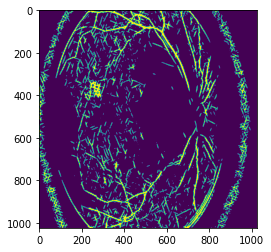

In [0]:
print(set(x_train[0]))
plt.imshow(x_train[0].reshape((1024,1024)))
plt.show()

In [0]:
type(x_train[0])

numpy.ndarray

In [0]:
t = x_train[0].reshape((1024,1024))
t.shape

(1024, 1024)

In [0]:
x_train1 = x_train.reshape(351,1024,1024,-1)
x_train1.shape


(351, 1024, 1024, 1)

In [0]:
x_test.shape

(62, 1048576)

In [0]:
x_test1 = x_test.reshape(62,1024,1024,-1)
x_test1.shape

(62, 1024, 1024, 1)

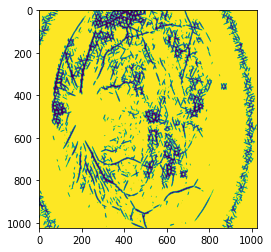

In [0]:
#print(set(xtrain1[0]))
plt.imshow(x_train1[0].reshape((1024,1024)))
plt.show()

In [0]:
x_train1

array([[[[105],
         [105],
         [105],
         ...,
         [105],
         [105],
         [105]],

        [[105],
         [105],
         [105],
         ...,
         [105],
         [105],
         [105]],

        [[105],
         [105],
         [105],
         ...,
         [105],
         [105],
         [105]],

        ...,

        [[105],
         [105],
         [105],
         ...,
         [105],
         [105],
         [105]],

        [[105],
         [105],
         [105],
         ...,
         [105],
         [105],
         [105]],

        [[105],
         [105],
         [105],
         ...,
         [105],
         [105],
         [105]]],


       [[[ 55],
         [ 55],
         [ 55],
         ...,
         [ 55],
         [ 55],
         [ 55]],

        [[ 55],
         [ 55],
         [ 55],
         ...,
         [ 55],
         [ 55],
         [ 55]],

        [[ 55],
         [ 55],
         [ 55],
         ...,
         [ 55],
         [

In [0]:
from sklearn.preprocessing import OneHotEncoder

onehot_encoder = OneHotEncoder(sparse=False)


In [0]:
y_train = np.array(y_train)
y_test = np.array(y_test)


In [0]:
y_train1 = y_train.reshape(len(y_train), 1)
y_train1 = onehot_encoder.fit_transform(y_train1)
y_train1

array([[0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1.],
       ...,
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.]])

In [0]:
y_test1 = y_test.reshape(len(y_test), 1)
y_test1 = onehot_encoder.fit_transform(y_test1)
y_test1

array([[0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],


In [0]:
def build_model():
    print(" in build model ")
    
    model = Sequential()
    
    model.add(Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu', input_shape = (1024,1024,1)))
    model.add(Conv2D(32, kernel_size = 3, padding = 'same', strides = 2, activation = 'relu'))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(32, kernel_size = 3, padding = 'same', activation = 'relu'))
    model.add(Conv2D(64, kernel_size = 3, padding = 'same', strides = 2, activation = 'relu'))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(128, kernel_size = 3, padding = 'same', activation = 'relu'))
    model.add(Conv2D(256, kernel_size = 3, padding = 'same', strides = 2 , activation = 'relu'))
    model.add(MaxPool2D(3))
    
    model.add(BatchNormalization())
    
    model.add(Flatten())
    model.add(Dropout(0.2))
    model.add(Dense(512, activation = 'relu'))
    model.add(Dense(5, activation = 'softmax'))
    
    model.compile(optimizer = 'adam', loss = keras.losses.categorical_crossentropy, metrics = ["accuracy"])
    
    print("MODEL CREATED")
    #model.summary()
    
    return model


In [0]:
def fit_model():
    print(" in fitmodel")
    history = model.fit(x_train1, y_train1, batch_size = 32, epochs = 5, validation_split = 0.1)
    return history


# In[43]:

print("going to build")
model = build_model()
print("after build moel")

going to build
 in build model 




Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.




MODEL CREATED
after build moel


In [0]:
print("going to history")
model_history = fit_model()
print("after history")

if model_history:
  print('Final Accuracy: {:.2f}%'.format(model_history.history['acc'][4] * 100))
  print('Validation Set Accuracy: {:.2f}%'.format(model_history.history['val_acc'][4] * 100))


going to history
 in fitmodel
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 315 samples, validate on 36 samples
Epoch 1/5


In [0]:
#batch_size to train
batch_size = 32
# number of output classes
nb_classes = 5
# number of epochs to train
nb_epoch = 5
# number of convolutional filters to use
nb_filters = 32
# size of pooling area for max pooling
nb_pool = 2
# convolution kernel size
nb_conv = 3

In [0]:
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras.optimizers import SGD,RMSprop,adam

model = Sequential()

model.add(Convolution2D(nb_filters, nb_conv, nb_conv,
                        border_mode='valid',
                        input_shape=(256,256, 1)))
convout1 = Activation('relu')
model.add(convout1)
model.add(Convolution2D(nb_filters, nb_conv, nb_conv))
convout2 = Activation('relu')
model.add(convout2)
model.add(MaxPooling2D(pool_size=(nb_pool, nb_pool)))
model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(nb_classes))
model.add(Activation('softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adadelta')
print(model.summary())

RuntimeError: ignored

In [0]:
from keras.preprocessing.image import ImageDataGenerator

# create generators  - training data will be augmented images
validationdatagenerator = ImageDataGenerator()
traindatagenerator = ImageDataGenerator(width_shift_range=0.1,height_shift_range=0.1,rotation_range=15,zoom_range=0.1 )

batchsize=8
train_generator=traindatagenerator.flow(x_train1, y_train1, batch_size=batchsize) 
validation_generator=validationdatagenerator.flow(x_test1, y_test1,batch_size=batchsize)

In [0]:
model.fit_generator(train_generator, steps_per_epoch=int(len(x_train1)/batchsize), epochs=15, validation_data=validation_generator, validation_steps=int(len(x_test1)/batchsize))

Epoch 1/15
46/46 [==============================] - 69s 2s/step - loss: 11.4302 - val_loss: 10.8797
Epoch 2/15
46/46 [==============================] - 69s 1s/step - loss: 10.9045 - val_loss: 11.8515
Epoch 3/15
46/46 [==============================] - 70s 2s/step - loss: 11.0359 - val_loss: 11.3775
Epoch 4/15
46/46 [==============================] - 70s 2s/step - loss: 11.1350 - val_loss: 9.4812
Epoch 5/15
46/46 [==============================] - 70s 2s/step - loss: 10.7730 - val_loss: 8.5331
Epoch 6/15
46/46 [==============================] - 69s 2s/step - loss: 11.3426 - val_loss: 11.3775
Epoch 7/15
46/46 [==============================] - 70s 2s/step - loss: 11.0374 - val_loss: 10.8797
Epoch 8/15
46/46 [==============================] - 69s 2s/step - loss: 10.7929 - val_loss: 9.9553
Epoch 9/15
46/46 [==============================] - 70s 2s/step - loss: 10.9045 - val_loss: 10.9034
Epoch 10/15
46/46 [==============================] - 70s 2s/step - loss: 10.7308 - val_loss: 8.0590
Epo

In [0]:
scores = model.evaluate(x_test1, y_test1)
print(scores)

42/42 [==============================] - 1s 22ms/step
10.361633119129


In [0]:
model.save("/content/drive/My Drive/EDI2 - Diabetic Ratinopathy/IDRID Dataset/B. Disease Grading/trained_model_new_15.h5")

In [0]:
from keras.models import load_model
from keras.preprocessing import image
import numpy as np

# dimensions of our images
img_width, img_height = 256,256



In [0]:
# load the model we saved
model = load_model('/content/drive/My Drive/EDI2 - Diabetic Ratinopathy/IDRID Dataset/B. Disease Grading/output_file.h5')

OSError: ignored

In [0]:
import h5py
from keras.models import load_model
loaded_model = h5py.File("/content/drive/My Drive/EDI2 - Diabetic Ratinopathy/IDRID Dataset/B. Disease Grading/output_file.h5")
model = load_model(loaded_model)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  This is separate from the ipykernel package so we can avoid doing imports until


ValueError: ignored

In [0]:
#loaded_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
score = loaded_model.evaluate(x_test1, y_test1, verbose=0)
print ("%s: %.2f%%" % (loaded_model.metrics_names[1], score[1]*100))

AttributeError: ignored

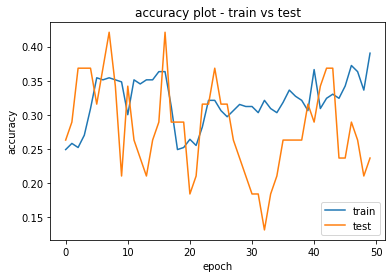

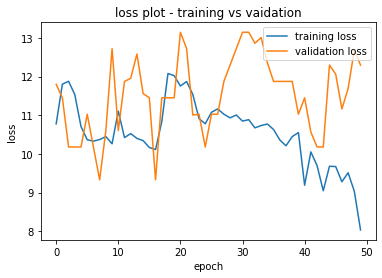

In [0]:
def plot_accuracy(y):
    if(y == True):
        plt.plot(model_history.history['acc'])
        plt.plot(model_history.history['val_acc'])
        plt.legend(['train', 'test'], loc='lower right')
        plt.title('accuracy plot - train vs test')
        plt.xlabel('epoch')
        plt.ylabel('accuracy')
        plt.show()
    else:
        pass
    return

def plot_loss(y):
    if(y == True):
        plt.plot(model_history.history['loss'])
        plt.plot(model_history.history['val_loss'])
        plt.legend(['training loss', 'validation loss'], loc = 'upper right')
        plt.title('loss plot - training vs vaidation')
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.show()
    else:
        pass
    return


plot_accuracy(True)
plot_loss(True)

In [0]:
from keras.utils import to_categorical
from numpy import argmax

y_pred = model.predict_classes(x_test1)


In [0]:
y_pred

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [0]:
from sklearn.preprocessing import OneHotEncoder

onehot_encoder = OneHotEncoder(sparse=False)
y_pred1 = y_pred.reshape(len(y_pred), 1)
onehot_encoded = onehot_encoder.fit_transform(y_pred1)

onehot_encoded_test = onehot_encoder.fit_transform(y_test.reshape(-1,1))

In [0]:
from sklearn.metrics import roc_auc_score

print("ROC AUC Score: ",roc_auc_score(y_test, onehot_encoded))

ValueError: ignored

In [0]:
from sklearn.metrics import f1_score
from sklearn import metrics

#print(metrics.classification_report(onehot_encoded_test.argmax(axis = 1), y_pred, digits=3))

In [0]:
y_test

array([3, 0, 0, 0, 3, 3, 1, 2, 3, 0, 3, 2, 3, 2, 2, 2, 0, 0, 3, 2, 2, 0,
       0, 2, 0, 0, 4, 4, 2, 2, 3, 4, 0, 2, 0, 2, 2, 2, 2, 0, 3, 4])

In [0]:
X = immatrix
Y = df_train['Retinopathy grade']

In [0]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.1)

In [0]:
x_train = np.array(x_train)
x_train1 = x_train.reshape(371,256,256,-1)
x_train1.shape

(371, 256, 256, 1)

In [0]:
x_test = np.array(x_test)
x_test1 = x_test.reshape(42,256,256,-1)
x_test1.shape

(42, 256, 256, 1)

In [0]:
y_train = np.array(y_train)
y_test = np.array(y_test)

In [0]:
y_train1 = y_train.reshape(len(y_train), 1)
y_train1 = onehot_encoder.fit_transform(y_train1)
y_train1

array([[0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.]])

In [0]:
y_test1 = y_test.reshape(len(y_test), 1)
y_test1 = onehot_encoder.fit_transform(y_test1)
y_test1

array([[0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0.

In [0]:
pip install tensorflow==1.14

     |████████████████████████████████| 109.2MB 28kB/s 
     |████████████████████████████████| 3.2MB 53.0MB/s 
     |████████████████████████████████| 491kB 41.7MB/s 
  Found existing installation: tensorboard 2.2.0
    Uninstalling tensorboard-2.2.0:
      Successfully uninstalled tensorboard-2.2.0
  Found existing installation: tensorflow-estimator 2.2.0rc0
    Uninstalling tensorflow-estimator-2.2.0rc0:
      Successfully uninstalled tensorflow-estimator-2.2.0rc0
  Found existing installation: tensorflow 2.2.0rc2
    Uninstalling tensorflow-2.2.0rc2:
      Successfully uninstalled tensorflow-2.2.0rc2


In [0]:
pred = pd.Series(pred)
y_test = pd.Series(y_test)

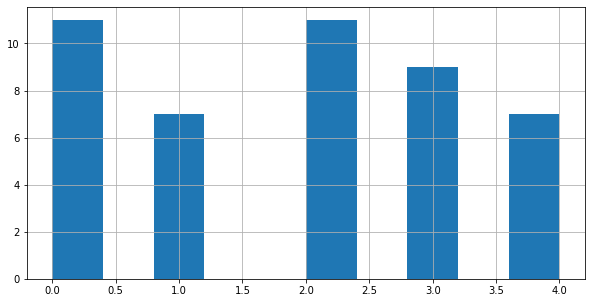

In [0]:
y_test.hist(figsize = (10, 5))

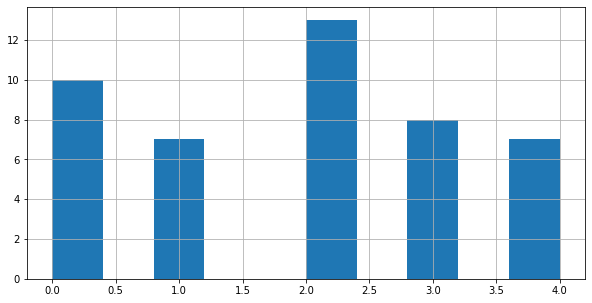

In [0]:
pred.hist(figsize = (10, 5))

In [0]:
pred = np.array(pred).reshape(-1, 1)
y_test = np.array(y_test).reshape(-1, 1)

In [0]:
from sklearn.preprocessing import OneHotEncoder
onehot_encoder = OneHotEncoder(sparse=False)

pred = np.array(pred)
y_test = np.array(y_test)

#pred = pred.reshape(-1, 1)
pred = onehot_encoder.fit_transform(pred)

#y_test = y_test.reshape(-1, 1)
y_test = onehot_encoder.fit_transform(y_test)

In [0]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
accuracy = accuracy_score(pred, y_test)
print('Accuracy: %f' % accuracy)
# precision tp / (tp + fp)
precision = precision_score(pred, y_test, average='macro')
print('Precision: %f' % precision)
# recall: tp / (tp + fn)
recall = recall_score(pred, y_test, average='macro')
print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(pred, y_test, average='macro')
print('F1 score: %f' % f1)


Accuracy: 0.911111
Precision: 0.923232
Recall: 0.933846
F1 score: 0.926331


In [0]:
from sklearn import metrics
matrix = metrics.confusion_matrix(y_test,pred)
print("Confusion Metrix:\n",metrics.confusion_matrix(pred,y_test))

Confusion Metrix:
 [[ 9  0  1  0  0]
 [ 0  7  0  0  0]
 [ 2  0 10  1  0]
 [ 0  0  0  8  0]
 [ 0  0  0  0  7]]


In [0]:
from sklearn.preprocessing import normalize

normed_matrix = normalize(matrix, axis=1, norm='l1')
normed_matrix

array([[0.81818182, 0.        , 0.18181818, 0.        , 0.        ],
       [0.        , 1.        , 0.        , 0.        , 0.        ],
       [0.09090909, 0.        , 0.90909091, 0.        , 0.        ],
       [0.        , 0.        , 0.11111111, 0.88888889, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 1.        ]])

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


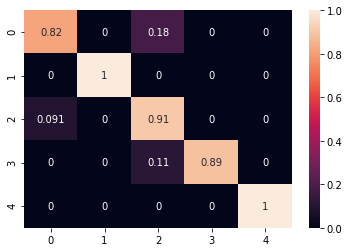

In [0]:
import seaborn as sns; 
ax = sns.heatmap(normed_matrix, annot=True)
ax